## IMAGE CREATION AND STUDY OF A GALAXY FROM SIMULATED DATA

 The aim of this work is to reconstruct the image of a galaxy, starting from data from the IllustrisTNG cosmological simulation, and progressively transform it into a realistic image, as if it were observed by a telescope from Earth, including atmospheric, instrumental, and background disturbances. To evaluate the quality of the final image obtained, the signal-to-noise ratio was calculated; moreover, for a deeper understanding of the nature of the simulated galaxy, two appendices were produced in which its spectral energy distribution (SED), the age and metallicity of its stars, and the color-magnitude diagram were studied.  
 The program is applicable to any galaxy from the "Milky-Way/Andromeda galaxies like" cutout. Specifically, in this work the "494709" cutout was considered, and all considerations and comments on the results refer to it.

# STEP 1: OPENING THE GALAXY SIMULATION FILE TAKEN FROM ILLUSTRIS TNG

IllustrisTNG (The Next Generation) is a cosmological simulation designed to study the formation and evolution of large-scale cosmic structures.  
The main objective of the simulation is to understand the physical mechanisms that regulate galaxy evolution, the accretion of supermassive black holes, energetic feedback from gas, star formation, and the distribution of dark matter, within a realistic cosmological context consistent with the standard $\Lambda$CDM model.  
The simulations are run in periodic cubic volumes of different sizes and use millions or billions of particles to represent the fundamental components of the Universe: gas (PartType0), dark matter (PartType1), stars (PartType4), and black holes (PartType5).  
The simulation produces a time sequence of snapshots (usually 100 per run), each representing the state of the Universe at a given redshift. Each snapshot is saved in HDF5 format and contains the properties of all the particles present in the simulated volume. Within each group are the datasets related to the physical properties of the particles, such as coordinates, masses, velocities, ages, metallicities, and synthetic magnitudes.  
The purpose of this first step is to read the full contents of the PartType groups and then acquire the datasets that were selected for use, namely the coordinates of the stellar particles and their magnitudes.


In [1]:
!pip install h5py   # installation of h5py, a library used to read HDF5 files

In [2]:
import h5py
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.convolution import convolve, Gaussian2DKernel

In [3]:
filename = "494709.hdf5"
# I open and inspect the structure of the file
with h5py.File(filename, 'r') as f:  # read-only mode ('r')
    def print_tree(name, obj):  # function used to print the file structure
        print(name)
    f.visititems(print_tree) # calls the function for every object in the file and prints its name

Header
PartType0
PartType0/CenterOfMass
PartType0/Coordinates
PartType0/Density
PartType0/ElectronAbundance
PartType0/EnergyDissipation
PartType0/GFM_AGNRadiation
PartType0/GFM_CoolingRate
PartType0/GFM_Metallicity
PartType0/GFM_Metals
PartType0/GFM_MetalsTagged
PartType0/GFM_WindDMVelDisp
PartType0/GFM_WindHostHaloMass
PartType0/InternalEnergy
PartType0/InternalEnergyOld
PartType0/MH
PartType0/MH2BR
PartType0/MH2GK
PartType0/MH2KMT
PartType0/Machnumber
PartType0/MagneticField
PartType0/MagneticFieldDivergence
PartType0/MainSnapshotIndex
PartType0/Masses
PartType0/NeutralHydrogenAbundance
PartType0/ParticleIDs
PartType0/Potential
PartType0/RotatedCenterOfMass
PartType0/RotatedCoordinates
PartType0/RotatedMagneticField
PartType0/RotatedVelocities
PartType0/StarFormationRate
PartType0/SubfindDMDensity
PartType0/SubfindDensity
PartType0/SubfindHsml
PartType0/SubfindID
PartType0/SubfindVelDisp
PartType0/Velocities
PartType0/Xray_Emission_03_2keV
PartType0/Xray_Emission_03_2keV_C
PartType0/

In [4]:
# I download the data I need
with h5py.File(filename, 'r') as f:
    N = f["PartType4"]["GFM_StellarPhotometrics"].shape[0] # where N is the number of particles for which magnitudes are available
    coords = f["PartType4"]["Coordinates"][:N]  # three-dimensional coordinates (x, y, z) of the stellar particles, only those that also have magnitudes
    mags = f["PartType4"]["GFM_StellarPhotometrics"][:]  # synthetic magnitudes for each particle, in 8 different photometric bands

WHAT DO I OBTAIN? In the IllustrisTNG project, not all stellar particles have computed photometric magnitudes: in particular, stars that are too young (age < 3 Myr) or not yet fully formed do not have associated fluxes. For this reason, it is essential to filter the particles according to the availability of the GFM_StellarPhotometrics field, which provides the synthetic magnitudes.  
In the code, the three-dimensional coordinates (coords, shape = N×3) and the magnitudes (mags, shape = N×8) are therefore extracted only for the particles with defined photometry. The 8 photometric bands available in the catalog are: u_SDSS, g_SDSS, r_SDSS, i_SDSS, z_SDSS (from the SDSS survey) and U_Johnson, B_Johnson, V_Buser (bands of the Johnson-Buser system). The SDSS bands cover the range from near ultraviolet (NUV) to near infrared (NIR) and are expressed in the AB system, while the Johnson-Buser bands represent the classical optical range and are expressed in the Vega system, in which the zero point is defined on the spectrum of the star Vega.

# STEP 2: CREATION OF THE IMAGES ON THE XY PLANE (observer distance equal to 0)


In this step I take as input the stellar x and y coordinates and the particle magnitudes in the different bands provided by step 1. I process the magnitudes by converting them into relative fluxes, which are mapped onto a pixel grid. I therefore obtain as output a two-dimensional map of the luminous flux for each of the 8 photometric bands.
  
Astronomical magnitudes are a logarithmic and inverse scale that measures the perceived brightness of an object. The modern definition is based on Pogson’s relation:  
                $$M= -2.5 \cdot \log_{10}(\frac{F}{F0})$$  
where F is the measured flux (energy received per unit area, time, and frequency) and F0 is the reference zeropoint for that band. The flux is therefore obtained through:  
                $$F=F0 \cdot 10^{-0.4 \cdot M}$$  
In my code, in the following step, I consider F/F0 = relative flux (dimensionless); this is sufficient to construct photometric images on an arbitrary scale, where only the relative contrast matters. It will be shown later, in step 3, that in order to obtain more accurate images and later calculate the SED and estimate the noise, the reference F0 values of each band were included.


In [5]:
# Image parameters
img_size = 512  # pixels per side
fov = 50  # physical field to represent, i.e. a square camera framing 50 kpc

# Labels of the 8 GFM_StellarPhotometrics bands
band_labels = [
    "u_SDSS", "g_SDSS", "r_SDSS", "i_SDSS",
    "z_SDSS", "V_Buser", "U_Johnson", "B_Johnson"
]

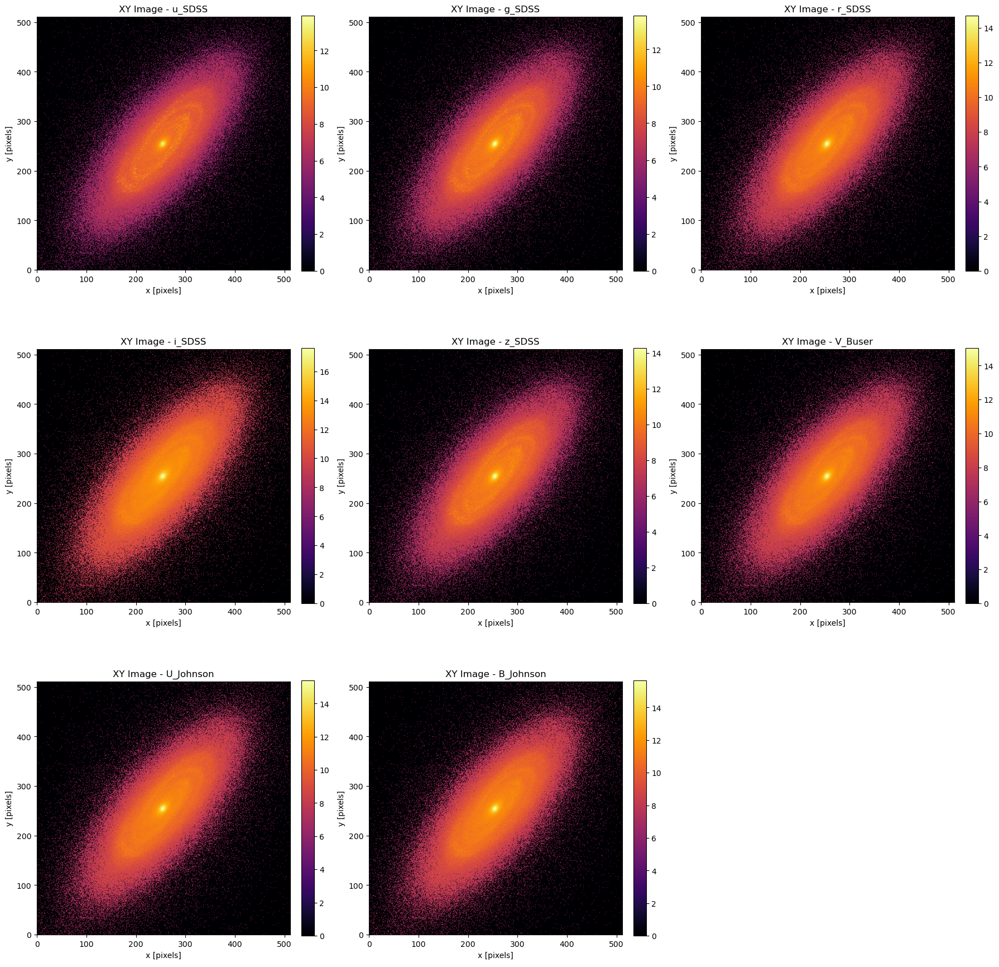

In [6]:
# 1) I project the coordinates and create the map
x = coords[:, 0] # extract coordinates
y = coords[:, 1]
x_center = np.median(x)  # place the image center at the center of the galaxy
y_center = np.median(y)
x_img = x - x_center  # from -fov/2 to fov/2
y_img = y - y_center

# 2) Convert coordinates (kpc) into pixels
# Specifically:
# 2.1) shift the range from [-fov/2, +fov/2] to [0, fov]
# 2.2) normalize the coordinates in the range [0, 1] by dividing by fov
# 2.3) rescale the coordinates to [0, img_size]
# 2.4) convert to integer pixels (.astype(int))
pixels_x = ((x_img + fov/2) / fov * img_size).astype(int)
pixels_y = ((y_img + fov/2) / fov * img_size).astype(int)

# Remove pixels outside the camera
valid = (pixels_x >= 0) & (pixels_x < img_size) & (pixels_y >= 0) & (pixels_y < img_size)

# 3) Compute the flux and create the image
images_xy = []

for i, band in enumerate(band_labels): # loop over the bands
    flux = 10 ** (-0.4 * mags[:, i])  # convert magnitudes into relative flux
    image = np.zeros((img_size, img_size))
    np.add.at(image, (pixels_y[valid], pixels_x[valid]), flux[valid]) # for each valid pixel, sum the flux (NB: multiple particles may end up in the same pixel)
    images_xy.append(image)

# 4) Plot the 8 images corresponding to the 8 photometric bands
fig, axs = plt.subplots(3, 3, figsize=(18, 18))

for i, (image, label) in enumerate(zip(images_xy, band_labels)): # zip() associates each image with its band
    row = i // 3 # convert the linear index into (row, column) coordinates
    col = i % 3
    ax = axs[row, col]

    im = ax.imshow(np.arcsinh(image), origin='lower', cmap='inferno') # use arcsinh to highlight both bright and faint regions

    ax.set_title(f"XY Image - {label}")
    ax.set_xlabel("x [pixels]")
    ax.set_ylabel("y [pixels]")

    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04) # add a color bar to interpret the flux level

axs[2, 2].axis('off') # remove the empty panel at the bottom right
plt.tight_layout()
plt.show()

OBSERVATION: the formula used to calculate the relative fluxes would actually require the apparent magnitude; however, the data provided by Illustris StellarPhotometrics are absolute magnitudes. Therefore, the output obtained in this step is not entirely correct, but it is used as a first experimental approach for plotting the galaxy images. In step 3, after computing the apparent magnitudes by placing the galaxy at a chosen distance, the fluxes and consequently the images were recalculated correctly, and these are the ones used for the rest of the work.

## STEP 3: PLACING THE GALAXY AT AN ARBITRARY DISTANCE


In this step I use the same input as in step 2, but the data are processed differently, as mentioned in the previous observation and explained in detail below. The output is a flux map in celestial coordinates (no longer x and y, but RA and DEC), where the flux is no longer relative but absolute.  
To simulate how a galaxy would actually be observed by a telescope on Earth, it is necessary to assume a realistic distance between the simulated galaxy and the observer. In my case I chose an arbitrary distance of 10 Mpc, corresponding to a galaxy in the nearby Universe.  
I therefore convert the magnitudes into apparent magnitudes, i.e. values that represent what we would see from Earth:  
             $$m= M + 5 \cdot \log_{10}(d_{pc}) -5$$  
and from there I recalculate the fluxes, also taking into account the F0 values of the different bands.  
Moreover, to obtain an image as it would be observed in the sky, it is necessary to express it using celestial spherical coordinates: right ascension (RA) and declination (DEC).  
Recall that right ascension is the angle between the direction of the particle and the x-axis, projected onto the xy plane (equatorial plane); it is calculated as:  
             $$ RA= \arctg2{(y,x)}$$  
Declination, instead, is the angle between the direction of the particle and the equatorial plane:  
             $$ DEC= \arcsin{(\frac{z}{r})}$$  
 where $r=\sqrt{x^2 + y^2+z^2}$.  
NB: to obtain RA and DEC in degrees, one must also use:  
             $$ RA (deg) = RA \cdot (\frac{180°}{\pi}) \cdot mod360 $$  
             $$ DEC (deg) =DEC \cdot (\frac{180°}{\pi})$$  
RA ranges from 0° to 360°, while DEC ranges from −90° to +90°, like terrestrial latitude.


In [7]:
# Define an arbitrary distance between observer and galaxy: 10 Mpc (in parsecs)
d_pc = 1e7

# Array of reference fluxes F0 (in erg/s/cm^2/Hz) for each band
F0 = np.array([
    3.631e-20,  # u_SDSS
    3.631e-20,  # g_SDSS
    3.631e-20,  # r_SDSS
    3.631e-20,  # i_SDSS
    3.631e-20,  # z_SDSS
    3.75e-20,   # V_Buser
    1.81e-20,   # U_Johnson
    1.26e-20    # B_Johnson
])

# Exposure time
exptime = 600  # seconds

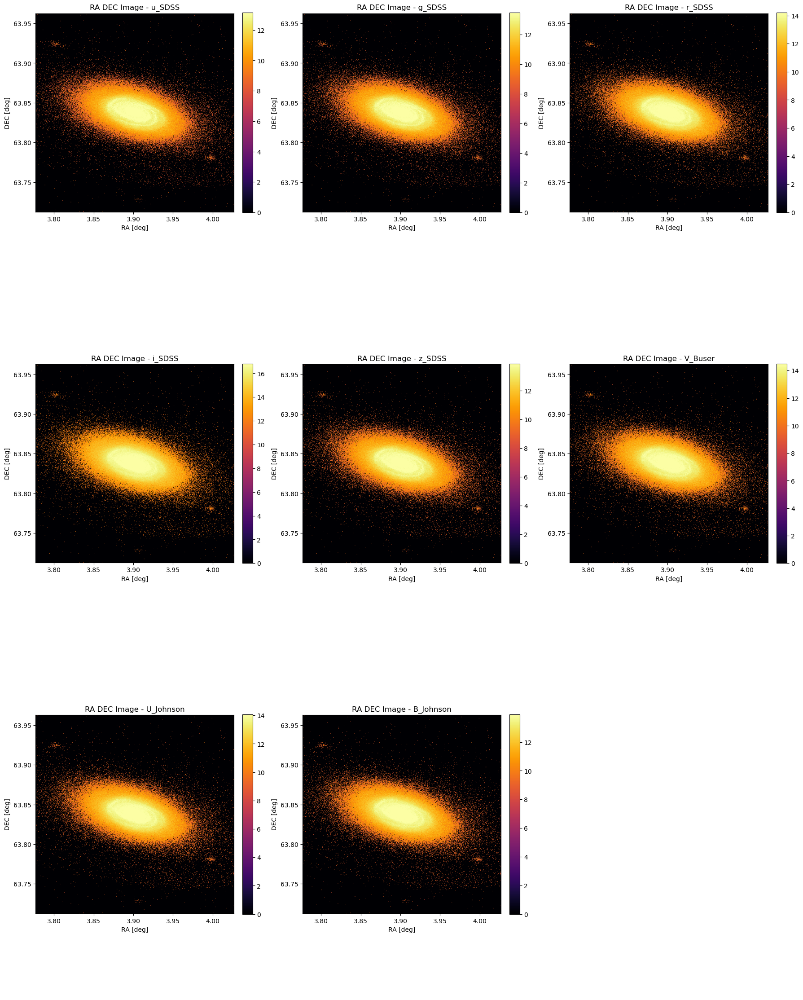

In [8]:
# 1) Compute apparent magnitudes from the absolute magnitudes in the dataset
mags_apparent = mags + 5 * np.log10(d_pc) - 5

# 2) Compute absolute physical fluxes multiplied by the exposure time
flux_absolute = F0 * 10 ** (-0.4 * mags_apparent) * exptime

# 3) Shift the galaxy along the z-axis (10 Mpc = 10000 kpc), with the observer at the origin
d_kpc = 10000
coords_shifted = coords.copy()
coords_shifted[:, 2] += d_kpc

# 4) Compute RA and DEC coordinates in degrees
x, y, z = coords_shifted[:, 0], coords_shifted[:, 1], coords_shifted[:, 2]
r = np.sqrt(x**2 + y**2 + z**2)
ra = np.arctan2(y, x)         # radians; unlike arctan(y/x), arctan2 works in all quadrants
dec = np.arcsin(z / r)        # radians
ra_deg = np.degrees(ra) % 360     # [0, 360]
dec_deg = np.degrees(dec)         # [-90, 90]

# 5) Map RA and DEC onto a 2D image
img_size = 512 # pixel resolution of the final image

# 5.1) Compute the range centered on the galaxy (only for visual purposes)
ra_center = np.median(ra_deg)
dec_center = np.median(dec_deg)
ra_width = 0.25
dec_width = 0.25

# Make the field of view range from ra/dec_center - width/2 to ra/dec_center + width/2
ra_range = (ra_center - ra_width / 2, ra_center + ra_width / 2)
dec_range = (dec_center - dec_width / 2, dec_center + dec_width / 2)

# 5.2) Map RA and DEC into pixel coordinates, normalizing to the field of view
pixels_x = ((ra_deg - ra_range[0]) / (ra_range[1] - ra_range[0]) * img_size).astype(int)
pixels_y = ((dec_deg - dec_range[0]) / (dec_range[1] - dec_range[0]) * img_size).astype(int)

# Remove pixels outside the camera
valid = (pixels_x >= 0) & (pixels_x < img_size) & (pixels_y >= 0) & (pixels_y < img_size)

# 6) Compute the image for each band
scaling_factor = 1e30  # brings fluxes to a visible scale as pixel intensities (they would otherwise be too small)
images_radec = []

# 6.1) Compute the fluxes and create the images
for i in range(8):
    image = np.zeros((img_size, img_size))
    flux_scaled = flux_absolute[:, i] * scaling_factor   # recall that i indexes the bands
    np.add.at(image, (pixels_y[valid], pixels_x[valid]), flux_scaled[valid])
    image_stretched = np.arcsinh(image)
    images_radec.append(image_stretched)

# 6.2) Plot
fig, axs = plt.subplots(3, 3, figsize=(18, 24))

for i, (img, label) in enumerate(zip(images_radec, band_labels)):
    row, col = i // 3, i % 3
    ax = axs[row, col]

    im = ax.imshow(
        img,
        origin='lower',
        cmap='inferno',
        extent=[ra_range[0], ra_range[1], dec_range[0], dec_range[1]],
        vmin=np.percentile(img, 10),
        vmax=np.percentile(img, 99) # set color limits using the 10th-99th percentiles for a more balanced representation
    )

    ax.set_title(f"RA DEC Image - {label}")
    ax.set_xlabel("RA [deg]")
    ax.set_ylabel("DEC [deg]")

    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

axs[2, 2].axis('off')
plt.tight_layout()
plt.show()

COMMENT ON THE RESULT: it can be observed that I used only part of the PartType4 information and not even all the available particle types. This choice was mainly motivated by the fact that for gas, which is the other main visible component, no magnitude dataset is present; moreover, the stellar component was chosen because it is the easiest to observe and analyze, also through a noise study. Despite the observational degradation, the distinctive features of the galaxy are clearly visible with my program, such as its spiral shape. It is also noticeable that different bands emphasize different features: the blue/UV bands are crucial for tracing the spiral structure and recent star formation, while the red/infrared bands reveal the total stellar mass, the halo, and the bulge.

## STEP 4: APPLYING SEEING TO THE IMAGE OF EACH BAND

In the next part of the project (steps 4 and 5), the ideal galaxy image is “contaminated” by adding noise in order to make the simulation more realistic, i.e. similar to what would be obtained through observations with a ground-based telescope. The image acquired by a terrestrial telescope is in fact degraded by physical and electronic effects caused by the passage of the signal through Earth’s atmosphere and by the structural characteristics of the telescope itself.  
To simulate the real situation, as a first step (step 4) the program analyzes the seeing phenomenon.  
The input data are those generated in step 3, namely the stellar flux map in celestial coordinates, which are then amplified by a factor of 100 to make weak signals more visible (also considering the addition of noise in the following steps). The seeing effect is then calculated, as explained below, and the output is a new set of images.  
Seeing is an atmospheric phenomenon that causes the distortion and apparent broadening of astronomical images observed from Earth. It is mainly due to turbulence in Earth’s atmosphere, which continuously alters the trajectory of light coming from stars and other celestial objects. This effect causes a point source, such as a star, not to appear as a point but as a blurred spot.  
To numerically simulate seeing, a convolution is used: a mathematical operation that combines the original image with a 2D Gaussian function, called a kernel or filter. This function acts like a mask which, for the considered pixel, computes a weighted average of the surrounding pixels, giving greater weight to the closest ones.  
Seeing is typically quantified through the FWHM (Full Width at Half Maximum) of this function, expressed in arcseconds. To construct the seeing kernel, one must use $\sigma$, the standard deviation of the Gaussian:  
             $$\sigma=\frac{FWHM}{2.355}$$  
The FWHM varies depending on the considered band: redder bands (such as i and z) generally have slightly better seeing, while blue bands (such as u) suffer from worse seeing.

In [9]:
# Amplify the images by a factor of 100:
# necessary for the following steps involving additional background noise
images_amplified = [image * 100 for image in images_radec]

# Compute the image scale in arcsec per pixel
scale_arcsec_per_pix = (ra_width * 3600) / img_size
# this gives how many arcseconds correspond to a single pixel

# FWHM in arcsec for each band
# data taken from https://www.sdss4.org/dr17/imaging/other_info/
fwhm_arcsec = {
    "u_SDSS": 1.7,
    "g_SDSS": 1.6,
    "r_SDSS": 2.5,
    "i_SDSS": 1.4,
    "z_SDSS": 1.3,
    "V_Buser": 1.55,
    "U_Johnson": 1.7,
    "B_Johnson": 1.6
}

# Create the images with seeing
images_with_seeing = []

for img, label in zip(images_amplified, band_labels):

    fwhm = fwhm_arcsec[label]

    # Convert FWHM from arcsec to pixels
    fwhm_pix = fwhm / scale_arcsec_per_pix

    # Compute the Gaussian standard deviation
    sigma_pix = fwhm_pix / 2.355

    # Create Gaussian kernel and apply convolution
    psf_kernel = Gaussian2DKernel(x_stddev=sigma_pix)
    # psf = point spread function, i.e. how much the light of a source is spread

    img_seen = convolve(img, psf_kernel)

    images_with_seeing.append(img_seen)

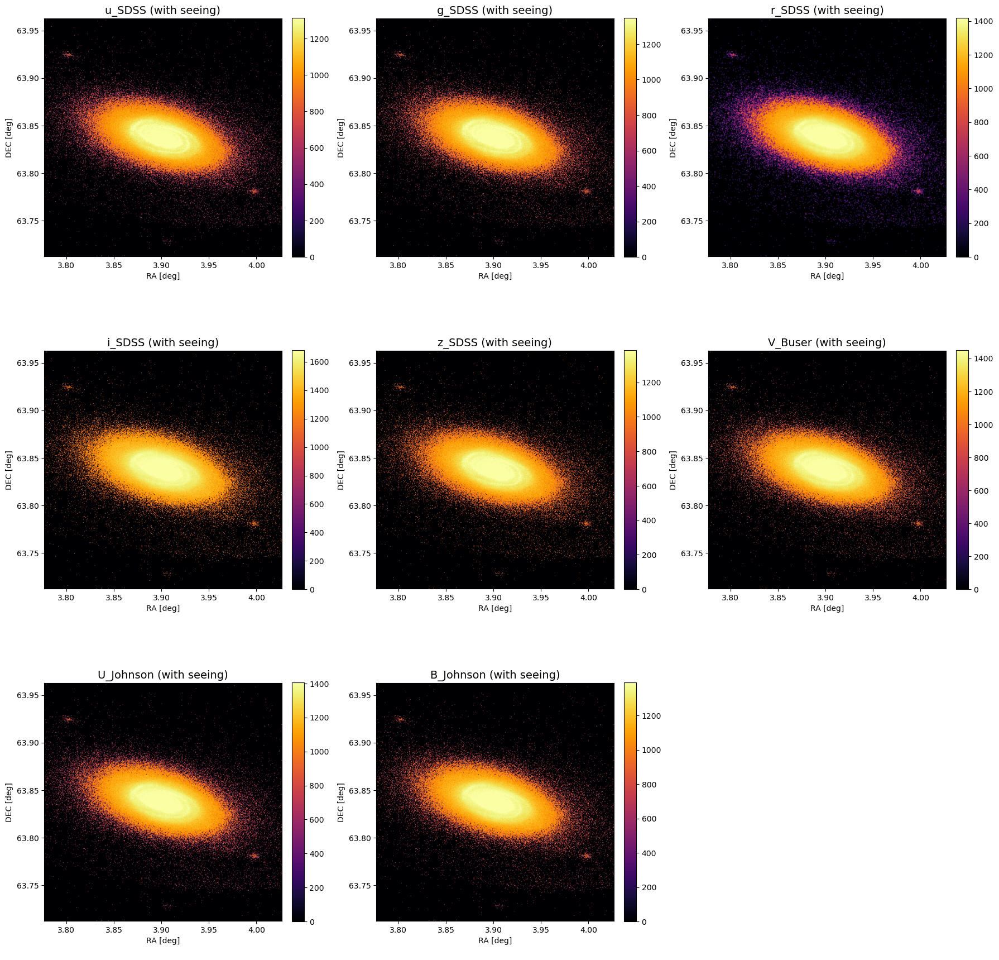

In [10]:
# Plot the images with seeing
fig, axs = plt.subplots(3, 3, figsize=(18, 18))

for i, (img, label) in enumerate(zip(images_with_seeing, band_labels)):

    row, col = i // 3, i % 3
    ax = axs[row, col]

    im = ax.imshow(
        img,
        origin='lower',
        cmap='inferno',
        extent=[ra_range[0], ra_range[1], dec_range[0], dec_range[1]],
        vmin=np.percentile(img, 10),
        vmax=np.percentile(img, 99)
    )

    ax.set_title(f"{label} (with seeing)", fontsize=14)

    ax.set_xlabel("RA [deg]")
    ax.set_ylabel("DEC [deg]")

    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

axs[2, 2].axis("off")

plt.tight_layout()
plt.show()

COMMENT ON THE RESULT: in all bands a general smoothing of the morphology can be observed: the nucleus appears more diffuse, fine structures such as the spiral arms become less defined, and the contrast between the central and peripheral regions decreases. The effect is more pronounced in the blue and ultraviolet bands (u_SDSS, g_SDSS, U_Johnson), where the seeing is worse, while bands such as z_SDSS or i_SDSS preserve better resolution.  
The set of FWHM values used for the 8 bands lies within a range between 1 and 2; considering that FWHM = 5 corresponds to poor seeing and FWHM = 0.4 corresponds to excellent seeing, the dataset can be considered to be in an intermediate condition. For a more detailed study, it would be necessary to have multiple sets of the 8 values in order to simulate different atmospheric conditions.

## STEP 5: ADDING SKY BACKGROUND AND TELESCOPE NOISE


In this block I take as input the simulated images with seeing and, for each photometric band, I add the main types of instrumental and sky background noise. The output is therefore the “sum” of the image with seeing and the image containing all the noise contributions.  
In astronomical observations, besides atmospheric seeing, several types of noise degrade image quality and must be considered in order to obtain realistic simulations. Among the main ones are sky background noise, read noise, dark current, and the statistical fluctuation of the signal itself (Poisson noise).  
Sky background noise is caused by the natural brightness of the night sky (airglow, Moon, light pollution) and is measured in magnitudes per arcsec²; in the program it is converted into electrons/pixel using the formula:  
             $$ F= 10^{[-0.4 \cdot (m_{sky}-zeropoint)]} \cdot exptime \cdot area$$  
and simulated with a Poisson distribution.  
Read noise is generated by the CCD electronics during signal digitization and is modeled as a normal (Gaussian) distribution with zero mean and a standard deviation equal to the typical detector value (e.g. 5 e⁻).  
Dark current is thermal noise, caused by the spontaneous generation of electrons in the pixels even in the absence of light: it is proportional to the exposure time and is simulated with another Poisson distribution.  
Finally, the true astronomical signal itself is subject to statistical fluctuations (quantum noise), which also follow a Poisson distribution, especially for low fluxes (it increases as the signal decreases).  
The different contributions are summed to obtain a final “noisy” image, representing what a ground-based telescope would actually measure.


In [11]:
# 1) Simulation parameters for the noise calculation

# 1.1) Parameters that differ for each band

# Sky background brightness
# once again from https://www.sdss4.org/dr17/imaging/other_info/

sky_mags = {
    "u_SDSS": 22.5,
    "g_SDSS": 22.8,
    "r_SDSS": 22.5,
    "i_SDSS": 21.9,
    "z_SDSS": 21.5,
    "V_Buser": 22.5,
    "U_Johnson": 22.5,
    "B_Johnson": 15.5
}

# Zeropoint = photometric constant relating magnitudes to physical flux measured in electrons
zeropoint = {
    "u_SDSS": 22.5,
    "g_SDSS": 23.9,
    "r_SDSS": 23.5,
    "i_SDSS": 23.0,
    "z_SDSS": 22.0,
    "V_Buser": 22.5,
    "U_Johnson": 21.5,
    "B_Johnson": 19.5
}

# 1.2) Parameters common to all bands
pixel_scale = 0.1      # arcsec/pixel
pixel_area = pixel_scale**2 # [arcsec²/pixel]

gain = 1.0             # e⁻/ADU
dark_current = 0.02    # e⁻/pix/sec
read_noise = 5.0       # e⁻ RMS

# 2) Noise calculation
noisy_images = []

for img_clean, label in zip(images_with_seeing, band_labels):
    # apply the noise to the images that already include seeing

    # Sky background noise
    m_sky = sky_mags[label]

    sky_electrons = (
        10**(-0.4 * (m_sky - zeropoint[label]))
        * exptime
        * pixel_area
    )

    sky_noise = np.random.poisson(
        sky_electrons,
        size=img_clean.shape
    )

    # Dark current noise
    dark = np.random.poisson(
        dark_current * exptime,
        size=img_clean.shape
    )

    # Read noise
    read = np.random.normal(
        loc=0.0,
        scale=read_noise,
        size=img_clean.shape
    )

    # Noise from the signal itself
    signal = np.random.poisson(
        np.clip(img_clean, 0, None)
    )

    # Sum of all noise contributions
    total_electrons = signal + sky_noise + dark + read

    # Convert the total number of detected electrons in each pixel into digital units
    noisy_image = total_electrons / gain

    noisy_images.append(noisy_image)

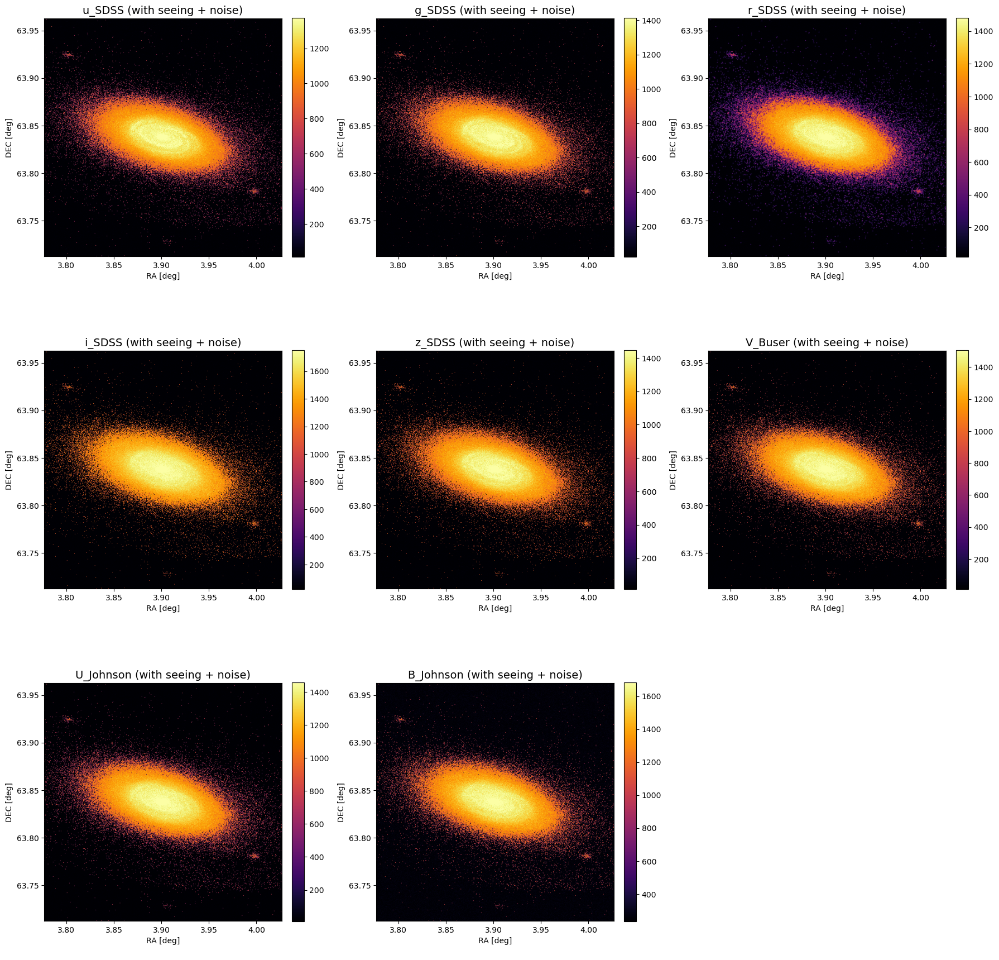

In [12]:
# Plot the noisy signals
fig, axs = plt.subplots(3, 3, figsize=(18, 18))

for i, (img, label) in enumerate(zip(noisy_images, band_labels)):

    row, col = i // 3, i % 3
    ax = axs[row, col]

    im = ax.imshow(
        img,
        origin='lower',
        cmap='inferno',
        extent=[ra_range[0], ra_range[1], dec_range[0], dec_range[1]],
        vmin=np.percentile(img, 10),
        vmax=np.percentile(img, 99.5)
    )

    ax.set_title(f"{label} (with seeing + noise)", fontsize=14)

    ax.set_xlabel("RA [deg]")
    ax.set_ylabel("DEC [deg]")

    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

axs[2, 2].axis("off")

plt.tight_layout()
plt.show()

COMMENT ON THE RESULT: in all bands the image appears more disturbed compared to both the clean image and the image including only seeing. Visually, the background appears grainier and less uniform, and the fine details of the galaxy (especially in the outer regions and the spiral arms) become more confused with the background.  
The effect is more evident in the z_SDSS, u_SDSS, and i_SDSS bands, while the U_Johnson and B_Johnson bands appear less affected by the added noise.  
Each type of noise has a specific impact on the final image quality:  
- Sky background noise: it is the dominant contribution to the diffuse granularity of the background. Its intensity varies among the bands, being stronger in the red bands (e.g. z_SDSS), where the sky is naturally brighter. Sky background noise reduces the contrast between the galaxy and the background, making the faintest and outermost regions of the source less distinct.  
- Dark current: contributes to a diffuse background level, more homogeneous but still perceptible, especially in channels where the galaxy signal is weak (e.g. U_Johnson or z_SDSS)  
- Read noise: is particularly visible in the darkest pixels, where it is not “masked” by the galactic signal.  
- Signal Poisson noise: is more evident in the nucleus of the galaxy, where the signal is stronger; indeed, there the absolute fluctuations are also larger (the variance of the signal, i.e. the Poisson error, increases).  
For a more quantitative analysis of what happened to the galaxy images after the addition of noise, see section 6, where I calculated the signal-to-noise ratio in the different bands.

## STEP 6: CALCULATION OF THE SIGNAL-TO-NOISE RATIO

In this part of the code, the input is the result obtained in step 5, namely the images containing the sum of the four considered types of noise plus seeing, and the signal-to-noise ratio S/N is calculated.  
The obtained results are analyzed for each band and compared with a generic quality table for the signal-to-noise ratio (reported below).  
S/N is calculated both for the amplified image and for the original one, expecting much better outputs for the amplified signals.

The signal-to-noise ratio (S/N) is a quantitative measure of the quality of an astronomical observation: it indicates how strongly the signal coming from a celestial object stands out with respect to the background and instrumental noise.  
It is fundamental for evaluating the reliability of an image and the possibility of extracting scientifically meaningful information: a high S/N implies a clear detection, while a low S/N makes it difficult to distinguish the signal from random noise.  
The calculation of the global S/N for a simulated image is:  
             $$\frac{S}{N}=\frac{\sum_{i}S_i}{\sigma_{noise} \cdot \sqrt{N_{pix}}} $$  
where $\sum_{i}S_i$ is the total signal summed over all pixels, $\sigma_{noise}$ is the standard deviation of the noise (empirically estimated as the difference between the noisy image and the signal), and $N_{pix}$ is the number of pixels with non-zero signal.

In [13]:
for i, label in enumerate(band_labels):

    signal_unamp = images_amplified[i]
    noisy = noisy_images[i]

    # 1. Total signal
    signal_tot_unamp = signal_unamp.sum()

    # 2. Noise per pixel: empirical estimate
    noise_estimate = noisy - signal
    # noise residual = random fluctuations around the expected signal

    noise_std = np.std(noise_estimate)
    # standard deviation of the noise

    # 3. Total noise (summed in quadrature)
    noise_tot_same = noise_std * np.sqrt(
        np.count_nonzero(signal_unamp)
    )

    # 4. Global S/N ratio
    sn_unamp = (
        signal_tot_unamp / noise_tot_same
        if noise_tot_same != 0 else 0
    )

    print(f"\nBand: {label}")
    print(f"  S/N ratio : {sn_unamp:.2f}")


Band: u_SDSS
  S/N ratio : 5243.13

Band: g_SDSS
  S/N ratio : 8035.16

Band: r_SDSS
  S/N ratio : 2597.38

Band: i_SDSS
  S/N ratio : 2554.65

Band: z_SDSS
  S/N ratio : 7685.77

Band: V_Buser
  S/N ratio : 7696.38

Band: U_Johnson
  S/N ratio : 10375.46

Band: B_Johnson
  S/N ratio : 14550.56


COMMENT ON THE RESULT: referring to the table above and to the obtained S/N values, it can be observed that all bands reach excellent S/N ratios, ensuring sharp images and a clearly visible morphology.

## STEP 7: ADDITION OF COSMIC RAYS

In this final step, the noisy images generated in step 6 are taken as input and artificial high-intensity bright spots are added through random uniform distributions in order to simulate the disturbance caused by cosmic rays.  
Cosmic rays are high-energy particles coming from space, originating from sources such as supernovae, active galactic nuclei, or extragalactic events. When they strike the detectors of a telescope (especially CCDs), they deposit energy in the form of anomalous luminous signals, often localized and very intense, which do not correspond to real astrophysical sources.  
Although their incidence is greater in space-based observations, they can also be detected by ground-based telescopes.  
They differ from the real signal because of their point-like or linear shape, isolated and often saturated, unlike the diffuse distribution of stellar or galactic light.  
Cosmic rays represent a significant disturbance in astronomical images: they can bias photometric measurements or create artifacts in object identification.  
To remove them, automatic cleaning techniques (cosmic ray cleaning) are used, such as median filtering algorithms over multiple exposures or direct identification through morphological analysis of anomalous pixels.

In [14]:
# Define a function to add cosmic rays to the images
def add_cosmic_rays(
    image,
    n_rays=50,
    intensity_range=(5000, 20000),
    size_range=(1, 5)
):

    img = image.copy()

    for _ in range(n_rays):

        # randomly choose a position (x,y) inside the image
        x = np.random.randint(0, img.shape[1])
        y = np.random.randint(0, img.shape[0])

        # randomly extract the ray intensity from the range
        intensity = np.random.uniform(*intensity_range)

        # randomly extract the ray size from the range
        size = np.random.randint(*size_range)

        # Create a circular mask of pixels to "illuminate",
        # centered on the selected pixel, to simulate a small disk-shaped impact
        y_indices, x_indices = np.ogrid[
            -size:size+1,
            -size:size+1
        ]

        mask = (
            x_indices**2 + y_indices**2 <= size**2
        )

        try:
            # avoid errors if the ray falls too close to the edge
            img[
                y-size:y+size+1,
                x-size:x+size+1
            ][mask] += intensity

        except:
            # if the cluster exceeds the image borders,
            # ignore it without stopping the execution
            continue

    return img

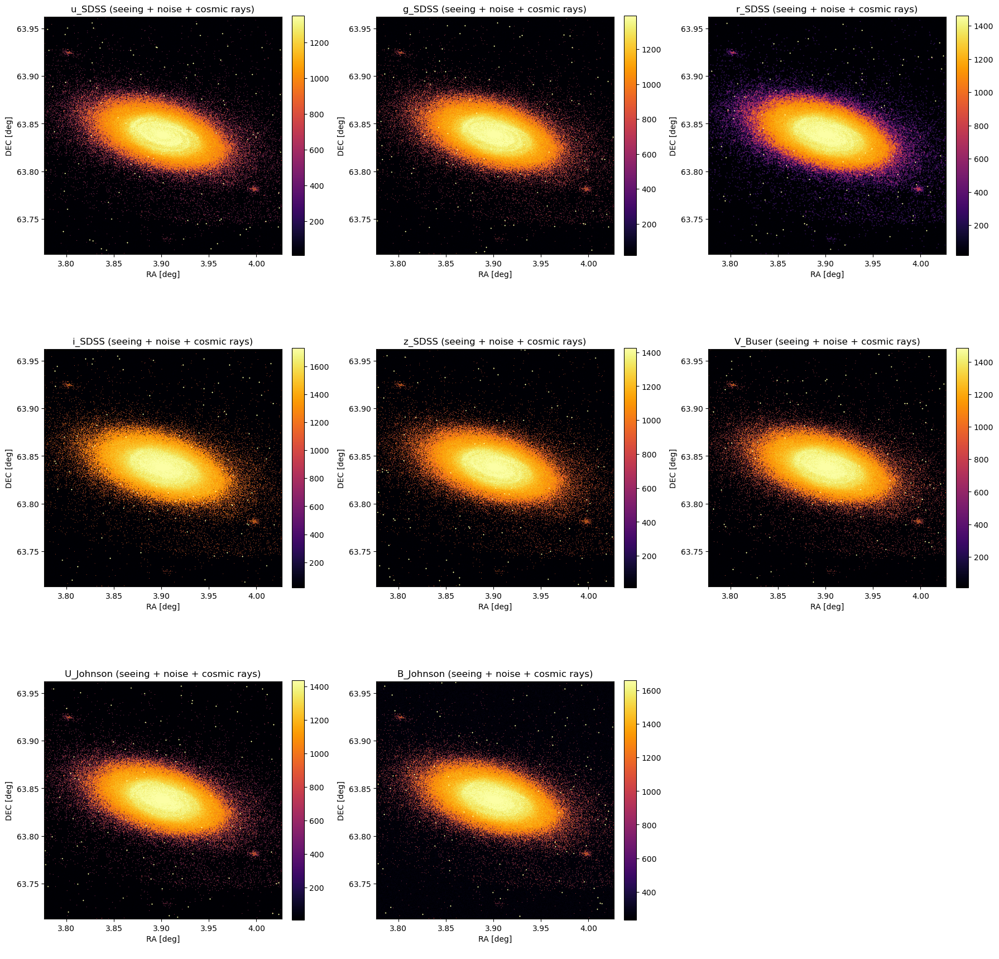

In [15]:
# Apply cosmic rays to each noisy image
noisy_images_with_cosmics = []

for img in noisy_images:

    img_with_cosmic = add_cosmic_rays(
        img,
        n_rays=100,                    # use 100 cosmic rays per image
        intensity_range=(8000, 25000),# increase intensity level
        size_range=(1, 2)             # smaller dimensions (small bright dots)
    )

    noisy_images_with_cosmics.append(img_with_cosmic)

# Plot the images with cosmic rays
fig, axs = plt.subplots(3, 3, figsize=(18, 18))

for i, (img, label) in enumerate(
    zip(noisy_images_with_cosmics, band_labels)
):

    row, col = i // 3, i % 3
    ax = axs[row, col]

    im = ax.imshow(
        img,
        origin='lower',
        cmap='inferno',
        extent=[
            ra_range[0],
            ra_range[1],
            dec_range[0],
            dec_range[1]
        ],
        vmin=np.percentile(img, 10),
        vmax=np.percentile(img, 99)
    )

    ax.set_title(
        f"{label} (seeing + noise + cosmic rays)"
    )

    ax.set_xlabel("RA [deg]")
    ax.set_ylabel("DEC [deg]")

    plt.colorbar(
        im,
        ax=ax,
        fraction=0.046,
        pad=0.04
    )

axs[2, 2].axis("off")

plt.tight_layout()
plt.show()

COMMENT ON THE RESULT: in bands such as u_SDSS or i_SDSS, where the S/N ratio is already lower, the effect of cosmic rays becomes more intrusive, since the contrast between the real signal and the disturbance is weaker.

## CONCLUSION

To conclude my study on the inverse process of astronomical image cleaning, I compare the images obtained at the different stages and focus in particular on one band, the u_SDSS band, since it is one of the bands where the noise had a significant impact, as can be seen from its relatively low S/N value.

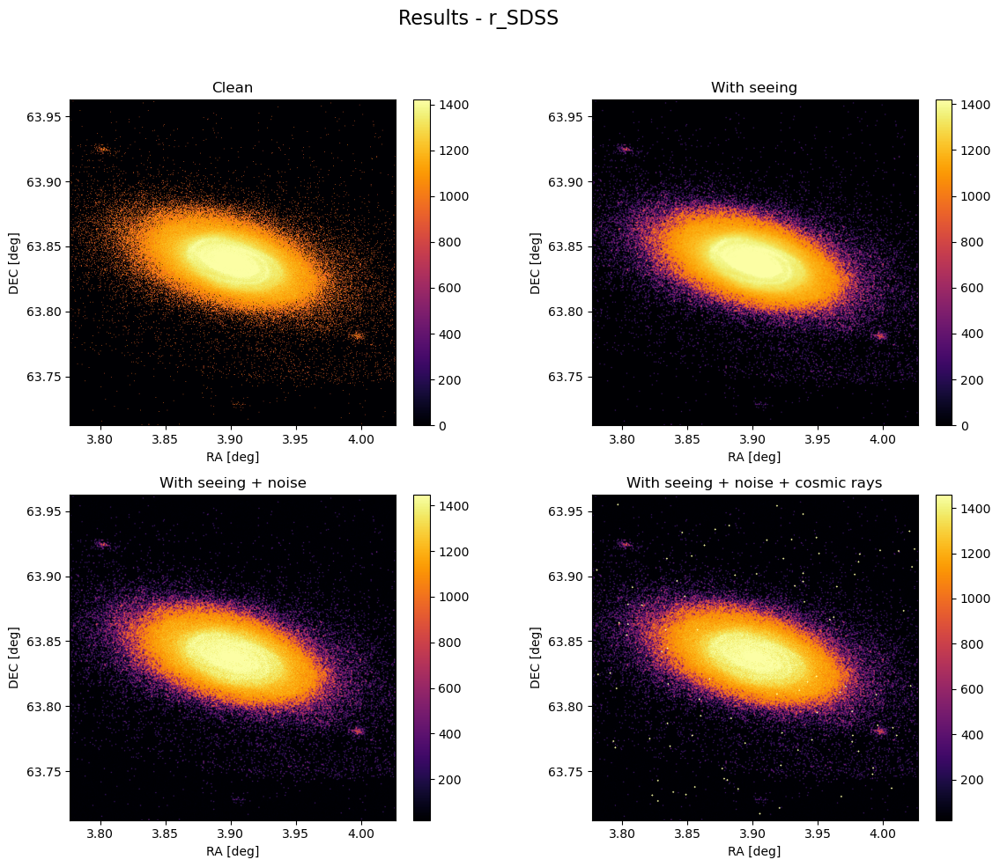

In [16]:
# Comparison using only the r_SDSS band as an example
comparison_images = [
    images_amplified[band_labels.index('r_SDSS')],
    images_with_seeing[band_labels.index('r_SDSS')],
    noisy_images[band_labels.index('r_SDSS')],
    noisy_images_with_cosmics[band_labels.index('r_SDSS')]
]

titles = [
    "Clean",
    "With seeing",
    "With seeing + noise",
    "With seeing + noise + cosmic rays"
]

fig, axs = plt.subplots(2, 2, figsize=(12, 10))

for i, (img, title) in enumerate(zip(comparison_images, titles)):

    row, col = divmod(i, 2)
    ax = axs[row, col]

    im = ax.imshow(
        img,
        origin='lower',
        cmap='inferno',
        extent=[
            ra_range[0],
            ra_range[1],
            dec_range[0],
            dec_range[1]
        ],
        vmin=np.percentile(img, 10),
        vmax=np.percentile(img, 99)
    )

    ax.set_title(title, fontsize=12)

    ax.set_xlabel("RA [deg]")
    ax.set_ylabel("DEC [deg]")

    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

fig.suptitle("Results - r_SDSS", fontsize=16)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

## APPENDIX [A]: CALCULATION OF THE GALAXY SED TO HIGHLIGHT ITS DISTINCTIVE FEATURES

The Spectral Energy Distribution (SED) of an astrophysical source is the representation of its spectral flux as a function of frequency, i.e. it shows how much energy is emitted at each frequency.  
For galaxies, the SED represents the sum of the contributions from all stellar populations, the interstellar medium (gas and dust), and possible active components (such as AGN).  
It therefore contains a wealth of information about global physical properties such as age, metallicity, star formation rates, and dust extinction.  
Since the simulated galaxy was extracted from the Illustris database and presents mass and structure compatible with a Milky Way-like galaxy, one expects its SED to show typical features of mature spiral galaxies: a peak in the optical-red regime, where old stellar populations dominate, and a gradual decline toward the ultraviolet, caused by the lower presence of young, hot, massive stars.

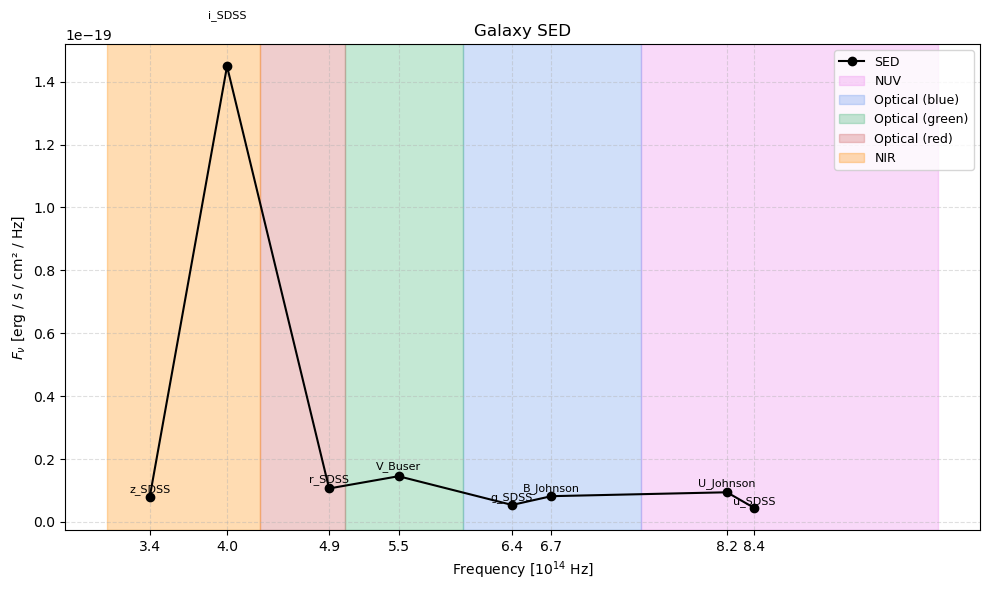

In [17]:
# 1) Compute the points to be used in the SED

# Central wavelengths (nm) of the 8 bands
wavelengths_nm = np.array([
    355, 468, 616, 748,
    893, 550, 365, 445
])

band_labels = [
    "u_SDSS",
    "g_SDSS",
    "r_SDSS",
    "i_SDSS",
    "z_SDSS",
    "V_Buser",
    "U_Johnson",
    "B_Johnson"
]

# Speed of light in nm/s
c_nm_s = 2.998e17

# Conversion from wavelength to frequency [Hz]
frequencies_Hz = c_nm_s / wavelengths_nm

# Sum the fluxes over all particles belonging to each band
# to obtain a single flux value for every band
flux_Fnu = flux_absolute.sum(axis=0)

# NB: flux_absolute[i, j] is the flux of particle i in band j,
# therefore .sum(axis=0) means summing over all particles

# 2) Prepare the SED plot

# Sort by increasing frequency
sorted_indices = np.argsort(frequencies_Hz)

frequencies_Hz = frequencies_Hz[sorted_indices]
flux_Fnu = flux_Fnu[sorted_indices]

band_labels_sorted = np.array(
    band_labels
)[sorted_indices]

# Define spectral regions useful for the SED
regions = {
    "NUV":            (c_nm_s / 400, c_nm_s / 300),
    "Optical (blue)": (c_nm_s / 500, c_nm_s / 400),
    "Optical (green)":(c_nm_s / 600, c_nm_s / 500),
    "Optical (red)":  (c_nm_s / 700, c_nm_s / 600),
    "NIR":            (c_nm_s / 1000, c_nm_s / 700)
}

# Assign arbitrary colors to improve visualization
region_colors = {
    "NUV": "violet",
    "Optical (blue)": "cornflowerblue",
    "Optical (green)": "mediumseagreen",
    "Optical (red)": "indianred",
    "NIR": "darkorange"
}

# 3) Plot the graph
plt.figure(figsize=(10, 6))

plt.plot(
    frequencies_Hz,
    flux_Fnu,
    marker='o',
    linestyle='-',
    color='black',
    label="SED"
)

# Highlight spectral regions
for name, (fmin, fmax) in regions.items():

    plt.axvspan(
        fmin,
        fmax,
        color=region_colors[name],
        alpha=0.3,
        label=name
    )

# Photometric band labels
for nu, flux, label in zip(
    frequencies_Hz,
    flux_Fnu,
    band_labels_sorted
):

    plt.text(
        nu,
        flux * 1.1,
        label,
        fontsize=8,
        ha='center',
        va='bottom'
    )

plt.xticks(
    frequencies_Hz,
    [f"{x / 1e14:.1f}" for x in frequencies_Hz]
)

plt.xlabel(r"Frequency [$10^{14}$ Hz]")
plt.ylabel(r"$F_\nu$ [erg / s / cm² / Hz]")

plt.title("Galaxy SED")

plt.grid(True, which='both', ls='--', alpha=0.4)

plt.legend(fontsize=9, loc='upper right')

plt.tight_layout()
plt.show()

OBSERVATION: a clear anomalous peak emerged in the near infrared (NIR), and this behavior is not what is typically expected for a spiral galaxy like the Milky Way, where a relatively flat SED is expected.  
This effect could indicate the dominant presence of old and massive stellar populations, or a high metallicity component, both of which can significantly alter the emitted spectral energy distribution.  
It is therefore necessary to analyze in greater detail the physical properties of the stellar population of the galaxy, in particular the age distribution, metallicity, and spatial localization of the brightest stars in the NIR bands.  
NB: it should also be remembered that the magnitudes in GFM_StellarPhotometrics are not computed for newly formed stars, therefore they do not contribute to the SED; consequently, the blue and UV emission is underestimated with respect to that of older stars, which shine mainly in the red/NIR.

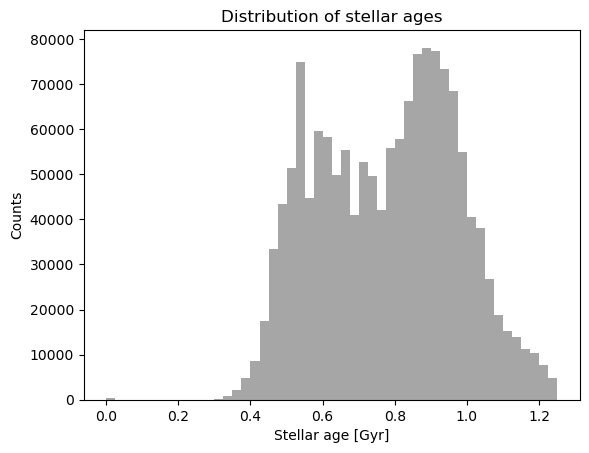

Mean age for each band:
u_SDSS: 0.98 Gyr
g_SDSS: 0.93 Gyr
r_SDSS: 0.90 Gyr
i_SDSS: 0.87 Gyr
z_SDSS: 0.92 Gyr
V_Buser: 0.89 Gyr
U_Johnson: 0.87 Gyr
B_Johnson: 0.87 Gyr


In [18]:
# 2) Read GFM_StellarFormationTime to compute stellar ages

with h5py.File(filename, 'r') as f:
    formation_times = f["PartType4"]["GFM_StellarFormationTime"][:N]

# Convert formation times into stellar ages (Gyr)
ages_gyr = (formation_times - formation_times.min())
# minimum value = present cosmic time

# Plot a histogram of stellar ages
plt.hist(ages_gyr, bins=50, color='gray', alpha=0.7)

plt.xlabel("Stellar age [Gyr]")
plt.ylabel("Counts")

plt.title("Distribution of stellar ages")

plt.show()

# Compute the flux-weighted mean stellar age for each band
ages_per_band = []

for i in range(8):

    # Compute the average age of the stars contributing to this band
    flux = 10 ** (-0.4 * mags[:, i])  # relative fluxes

    weighted_ages = ages_gyr * flux
    # age weighted by flux

    total_flux = flux.sum()
    # sum the fluxes for normalization

    if total_flux > 0:
        # if flux is non-zero, compute the flux-weighted mean age
        avg_age = weighted_ages.sum() / total_flux

    else:
        # avoid division by zero
        avg_age = 0

    ages_per_band.append(avg_age)

# Print the mean ages for each band
print(f"Mean age for each band:")

for label, age in zip(band_labels, ages_per_band):

    print(f"{label}: {age:.2f} Gyr")


COMMENT ON THE RESULT: the analysis of the stellar age distribution shows that the galaxy is dominated by relatively young stars (0.4–1.2 Gyr), with a peak between 0.8 and 1.0 Gyr.  
The complete absence of stars younger than 0.1 Gyr suggests the exclusion of newly formed stars from the GFM_StellarPhotometrics field, affecting the SED and shifting it toward the NIR.  
The flux-weighted mean ages for the different bands, ranging between 0.85 and 0.96 Gyr, confirm the absence of contributions from very young stars: even the u_SDSS band, which is sensitive to the UV, is dominated by evolved stellar populations.

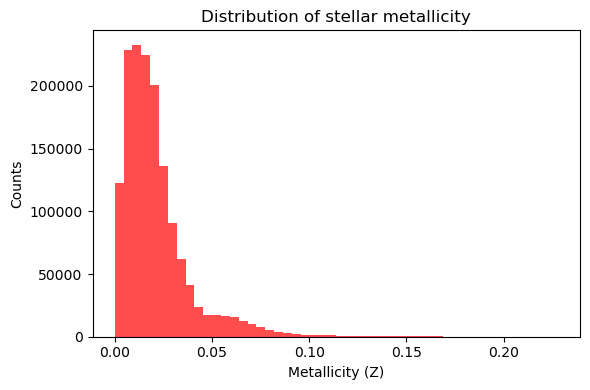

Mean metallicity: 0.0212


In [19]:
# 3) Read GFM_Metallicity to compute metallicity,
# i.e. the mass fraction made of elements heavier than helium (Z)

with h5py.File(filename, 'r') as f:
    metallicity = f["PartType4"]["GFM_Metallicity"][:N]

# Metallicity histogram
plt.figure(figsize=(6,4))

plt.hist(
    metallicity,
    bins=50,
    color='red',
    alpha=0.7
)

plt.xlabel("Metallicity (Z)")
plt.ylabel("Counts")

plt.title("Distribution of stellar metallicity")

plt.tight_layout()
plt.show()

print(f"Mean metallicity: {metallicity.mean():.4f}")

COMMENT ON THE RESULT: metallicity Z is a fundamental indicator of the chemical evolutionary stage of a galaxy.  
Low Z values (example: Zwicky18, a very young irregular dwarf galaxy: 0.0002) correspond to ancient stars formed in metal-poor environments, while high values (example: M31, a massive spiral galaxy: 0.02–0.03) indicate formation from gas already enriched by previous stellar generations.  
In the case of the simulated galaxy, the metallicity distribution shows a strong concentration between 0.005 and 0.03, with a tail extending toward higher values.  
The mean metallicity is slightly higher than the solar value (0.013) and fully compatible with an evolved Milky Way-like galaxy (0.015−0.02).  
This supports the idea of a mature stellar population, consistent with the measured mean age (0.9 Gyr), and suggests that significant chemical enrichment has already taken place.


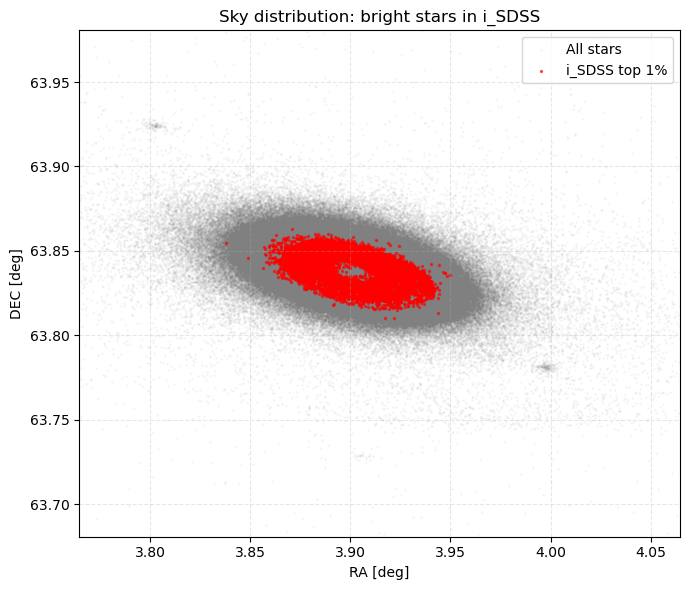

In [20]:
# 4) Investigate the location of the brightest stars
# in the band that turned out to be the brightest: i_SDSS

# Compute the relative flux in the i_SDSS band
flux_i = 10 ** (
    -0.4 * mags[:, band_labels.index("i_SDSS")]
)

# Select the top 1% brightest stars in i_SDSS
threshold = np.percentile(flux_i, 99)

bright_i_mask = flux_i > threshold

# Extract RA and DEC of these stars
ra_bright = ra_deg[bright_i_mask]
dec_bright = dec_deg[bright_i_mask]

# Scatter plot
plt.figure(figsize=(7, 6))

plt.scatter(
    ra_deg,
    dec_deg,
    s=1,
    alpha=0.05,
    color='gray',
    label='All stars'
)

plt.scatter(
    ra_bright,
    dec_bright,
    s=2,
    alpha=0.6,
    color='red',
    label='i_SDSS top 1%'
)

plt.xlabel("RA [deg]")
plt.ylabel("DEC [deg]")

plt.title(
    "Sky distribution: bright stars in i_SDSS"
)

plt.legend(loc="upper right")

plt.grid(True, ls='--', alpha=0.3)

# Zoom into a central region around the median,
# as done in the previous plots
ra_center = np.median(ra_bright)
dec_center = np.median(dec_bright)

ra_width = 0.30
dec_width = 0.30

plt.xlim(
    ra_center - ra_width / 2,
    ra_center + ra_width / 2
)

plt.ylim(
    dec_center - dec_width / 2,
    dec_center + dec_width / 2
)

plt.tight_layout()
plt.show()

COMMENT ON THE RESULT: the brightest stars in the NIR band appear to be located in the central region of the galaxy, although not entirely confined within the bulge.

# FINAL HYPOTHESIS:
one may speculate that the stars highlighted in the previous plot, which also contribute most strongly to the luminosity peak in the i_SDSS band of the SED, could be AGB stars (Asymptotic Giant Branch stars).  
These are evolved stars that have exhausted hydrogen and helium in their cores. They have intermediate masses (initially 1–8 solar masses), are very luminous and cool at the surface (red), and typically have ages between 0.2 and 2 Gyr.  
From a spatial point of view, they are not concentrated in the galactic center but are distributed more diffusely, often in rings or bands within the disk.  
For example, studies on M33 clearly show that AGB stars are prevalent in a metal-rich ring outside the central region ("AGB stars as tracers of metallicity and mean age across M33", Cioni, M.-R. L., et al. 2008).  
Similarly, in our own Galaxy it has been shown that AGB stars are located outside the center, although not arranged in a ring as in M33 ("The Galactic Distribution of Asymptotic Giant Branch Stars", Jackson, T., et al. 2002).  
Moreover, not all AGB stars are metal-rich, but their metallicity strongly depends on the environment and epoch in which they formed.  
If such stars are indeed present in evolved regions such as the inner disk of a Milky Way-like galaxy, it is reasonable to hypothesize that they are metal-rich.

## APPENDIX [B]: COLOR-MAGNITUDE DIAGRAM (HR-LIKE)

The color-magnitude diagram (CMD) is similar to the theoretical Hertzsprung–Russell diagram, but it represents on the x-axis the color of a star (i.e. the magnitude difference between two bands, such as g−r, which indicates the surface temperature), and on the y-axis its luminosity (typically an absolute magnitude in a single band, such as r).  
It is used to distinguish the different evolutionary stages of stars: the main sequence, red giants, AGB stars, and so on.

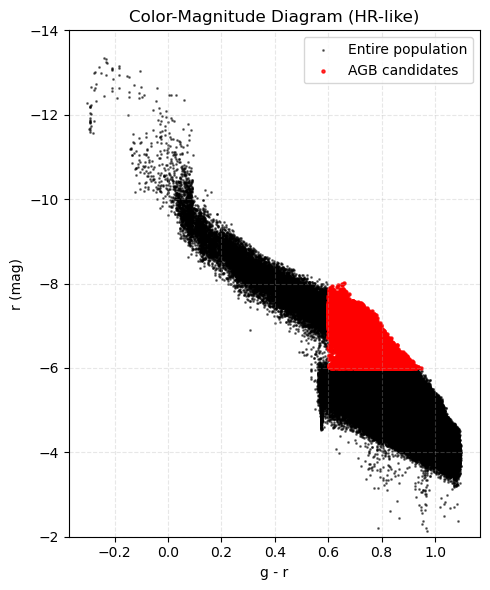

In [21]:
# Extract the absolute magnitudes in the g and r bands
# for all stellar particles

g = mags[:, band_labels.index("g_SDSS")]
r = mags[:, band_labels.index("r_SDSS")]

# g - r color
color_gr = g - r

# NB:
# small values = blue and hot stars
# large values = red and cool stars

# y-axis: r magnitude
r_mag = g

# Criteria for AGB candidates
is_agb = (
    (color_gr > 0.6) &
    (r_mag < -6)
)

# Plot
plt.figure(figsize=(5, 6))

plt.scatter(
    color_gr,
    r_mag,
    s=1,
    alpha=0.5,
    c='k',
    label='Entire population'
)

plt.scatter(
    color_gr[is_agb],
    r_mag[is_agb],
    s=5,
    alpha=0.8,
    color='red',
    label='AGB candidates'
)

plt.xlabel("g - r")
plt.ylabel("r (mag)")

# Invert axis to follow the magnitude convention
plt.gca().invert_yaxis()

plt.ylim(-2, -14)

plt.title("Color-Magnitude Diagram (HR-like)")

plt.grid(True, ls='--', alpha=0.3)

plt.legend(loc='upper right')

plt.tight_layout()
plt.show()

COMMENT ON THE RESULT: the obtained diagram appears well structured, with the youngest, blue, and luminous stars concentrated in the upper-left region (low g−r, bright r), while the more evolved, redder, and less luminous stars are distributed toward the lower-right region.  
The AGB candidates highlighted in red are located in the expected region: they are luminous (r < −6) and red (g−r > 0.6) ("Absolute Magnitude Calibration for Giants Based on the Colour–Magnitude Diagrams of Galactic Clusters", Karaali, S., et al., 2013).  
Their abundance was already expected from the SED analysis, and this color-magnitude diagram (g−r vs. r) is particularly effective in highlighting them.